In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file (replace 'dem_info.xlsx' with your actual file name)
data = pd.read_excel('dem_info.xlsx')

# Inspect column names to ensure they match the expected names
print("Column names in the dataset:", data.columns)

# OPTIONAL: Rename columns to standardize (if needed)
data.rename(columns={
    'ID':'ID',
    'Amzius': 'age',      # Replace 'amzius' with 'age'
    'Ugis': 'height',     # Replace 'ugis' with 'height'
    'Svoris': 'weight',   # Replace 'svoris' with 'weight'
    'KMI': 'BMI'          # Replace 'KMI' with 'BMI'
}, inplace=True)

# Ensure BMI is present or calculate it
if 'BMI' not in data.columns:
    data['BMI'] = data['weight'] / (data['height'] / 100) ** 2  # Height in cm

# 1. Descriptive Statistics Table
desc_stats = data[['age', 'weight', 'height', 'BMI']].describe()
print("\nDescriptive Statistics:")
print(desc_stats)

# Save descriptive statistics to an Excel file
desc_stats.to_excel('descriptive_statistics_output.xlsx', sheet_name='Descriptive Stats')

# 2. Visualization

# Histograms for each variable
variables = ['age', 'weight', 'height', 'BMI']
for var in variables:
    plt.figure(figsize=(8, 5))
    sns.histplot(data[var], kde=True, bins=20, color='blue')
    plt.title(f'Distribution of {var.capitalize()}')
    plt.xlabel(var.capitalize())
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

# Boxplot for all variables
plt.figure(figsize=(10, 6))
sns.boxplot(data=data[['age', 'weight', 'height', 'BMI']], palette='pastel')
plt.title('Boxplot of Variables')
plt.grid(True)
plt.show()

# Scatterplot for Weight vs. BMI
plt.figure(figsize=(8, 5))
sns.scatterplot(x='weight', y='BMI', data=data, hue='age', palette='coolwarm')
plt.title('Scatterplot of Weight vs. BMI')
plt.xlabel('Weight (kg)')
plt.ylabel('BMI')
plt.grid(True)
plt.show()


Reading E:\Analysis\re-referenced\OC\OC_1_R2_ch256_flt1-45_flt50_rejectedarte_rch_imp_ICA_prep_rf.fdt
Reading 0 ... 45380  =      0.000 ...   177.266 secs...
Reading E:\Analysis\re-referenced\UID\UID_101_R2256_imp_ch_flt1-45_flt50_rejectedarte_rch_ICA_prep_rf.fdt


C:\Users\donat\AppData\Local\Temp\ipykernel_5944\2534103867.py:27: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(file_path, preload=True)


Reading 0 ... 42281  =      0.000 ...   165.160 secs...


C:\Users\donat\AppData\Local\Temp\ipykernel_5944\2534103867.py:27: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(file_path, preload=True)


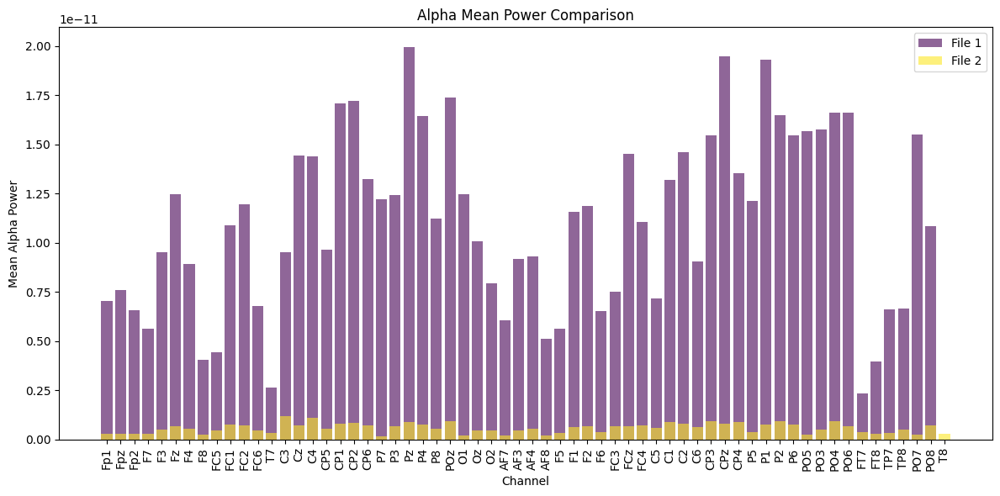

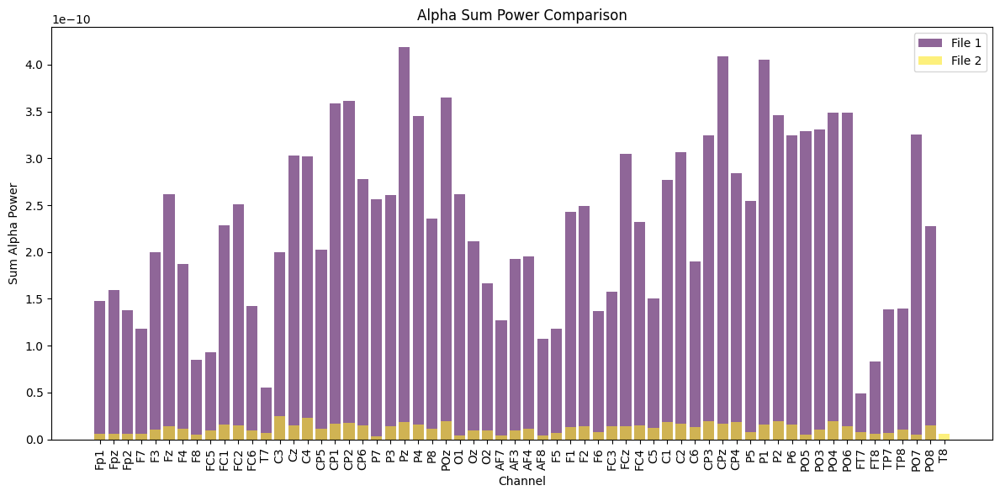

Combined PSD data saved to E:\Analysis\combined_psd_data.xlsx
Alpha Mean Power Comparison plot saved to 'E:\Analysis\alpha_mean_power_comparison.png'
Alpha Sum Power Comparison plot saved to 'E:\Analysis\alpha_sum_power_comparison.png'


In [32]:
import mne
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch
import pandas as pd

# List of file paths (add as many files as you want to process)
file_paths = [
    r"OC_1_R2_ch256_flt1-45_flt50_rejectedarte_rch_imp_ICA_prep_rf.set",
    r"UID_101_R2256_imp_ch_flt1-45_flt50_rejectedarte_rch_ICA_prep_rf.set" 
]

# Initialize lists to store PSD data and other metrics
all_psd_data = []
all_freqs = None
all_channel_names = []
file_alpha_means = []  # To store the alpha means for both files
file_alpha_sums = []  # To store the alpha sums for both files
file_channel_names = []  # To store channel names for each file

# Define a list of colors (you can customize this list)
colors = plt.cm.viridis(np.linspace(0, 1, len(file_paths)))  # Color map from matplotlib

# Step 1: Loop through each file to compute the PSD and alpha metrics
for file_idx, file_path in enumerate(file_paths):
    # Load the EEG data
    raw = mne.io.read_raw_eeglab(file_path, preload=True)
    
    # Get EEG data as a numpy array
    eeg_data = raw.get_data()  # Shape: (n_channels, n_samples)
    sfreq = raw.info['sfreq']  # Sampling frequency
    
    # Get the channel names for the current file
    current_channel_names = raw.info['ch_names']
    
    # Store channel names for this file
    file_channel_names.append(current_channel_names)

    # Compute PSD using Welch's method for each channel
    psds = []
    for i in range(eeg_data.shape[0]):
        f, Pxx = welch(eeg_data[i, :], fs=sfreq, nperseg=1024)
        
        if all_freqs is None:
            all_freqs = f  # Frequencies are the same for all channels, save once
        
        psds.append(Pxx)
    
    # Convert the PSDs to a numpy array (channels x frequencies)
    psds = np.array(psds)
    
    # Store the results for this file
    all_psd_data.append(psds)

    # Step 2: Extract alpha power (8-13 Hz) for each channel in this file
    alpha_mask = (all_freqs >= 8) & (all_freqs <= 13)  # Frequencies corresponding to alpha range (8-13 Hz)
    alpha_means_file = []
    alpha_sums_file = []
    
    for psd in psds:
        alpha_power = psd[alpha_mask]  # Get power within the alpha range
        alpha_means_file.append(np.mean(alpha_power))  # Mean of alpha power
        alpha_sums_file.append(np.sum(alpha_power))  # Sum of alpha power
    
    # Store the alpha metrics for this file
    file_alpha_means.append(alpha_means_file)
    file_alpha_sums.append(alpha_sums_file)

# Step 3: Plot the results (Alpha Mean Power and Alpha Sum Power for both files)

# Plot Alpha Mean Power for both files
plt.figure(figsize=(12, 6))
for i, alpha_means_file in enumerate(file_alpha_means):
    plt.bar(file_channel_names[i], alpha_means_file, color=colors[i], alpha=0.6, label=f'File {i+1}')
plt.title('Alpha Mean Power Comparison')
plt.xlabel('Channel')
plt.ylabel('Mean Alpha Power')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.savefig(r'alpha_mean_power_comparison.png')  # Save the plot as PNG
plt.show()

# Plot Alpha Sum Power for both files
plt.figure(figsize=(12, 6))
for i, alpha_sums_file in enumerate(file_alpha_sums):
    plt.bar(file_channel_names[i], alpha_sums_file, color=colors[i], alpha=0.6, label=f'File {i+1}')
plt.title('Alpha Sum Power Comparison')
plt.xlabel('Channel')
plt.ylabel('Sum Alpha Power')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.savefig(r'alpha_sum_power_comparison.png')  # Save the plot as PNG
plt.show()

# Step 4: Save the combined PSD data to an Excel file for FOOOF analysis
# Combine all PSD data for all files into a single DataFrame
psd_df = pd.DataFrame(np.vstack(all_psd_data).T, columns=np.concatenate(file_channel_names), index=all_freqs)

# Save to Excel
excel_file = r'combined_psd_data.xlsx'
psd_df.to_excel(excel_file)

print(f"Combined PSD data saved to {excel_file}")
print(f"Alpha Mean Power Comparison plot saved to 'E:\\Analysis\\alpha_mean_power_comparison.png'")
print(f"Alpha Sum Power Comparison plot saved to 'E:\\Analysis\\alpha_sum_power_comparison.png'")


Reading E:\Analysis\re-referenced\OC\OC_1_R2_ch256_flt1-45_flt50_rejectedarte_rch_imp_ICA_prep_rf.fdt
Reading 0 ... 45380  =      0.000 ...   177.266 secs...
Reading E:\Analysis\re-referenced\UID\UID_101_R2256_imp_ch_flt1-45_flt50_rejectedarte_rch_ICA_prep_rf.fdt
Reading 0 ... 42281  =      0.000 ...   165.160 secs...


C:\Users\donat\AppData\Local\Temp\ipykernel_5944\3858871611.py:24: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(file_path, preload=True)
C:\Users\donat\AppData\Local\Temp\ipykernel_5944\3858871611.py:24: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(file_path, preload=True)


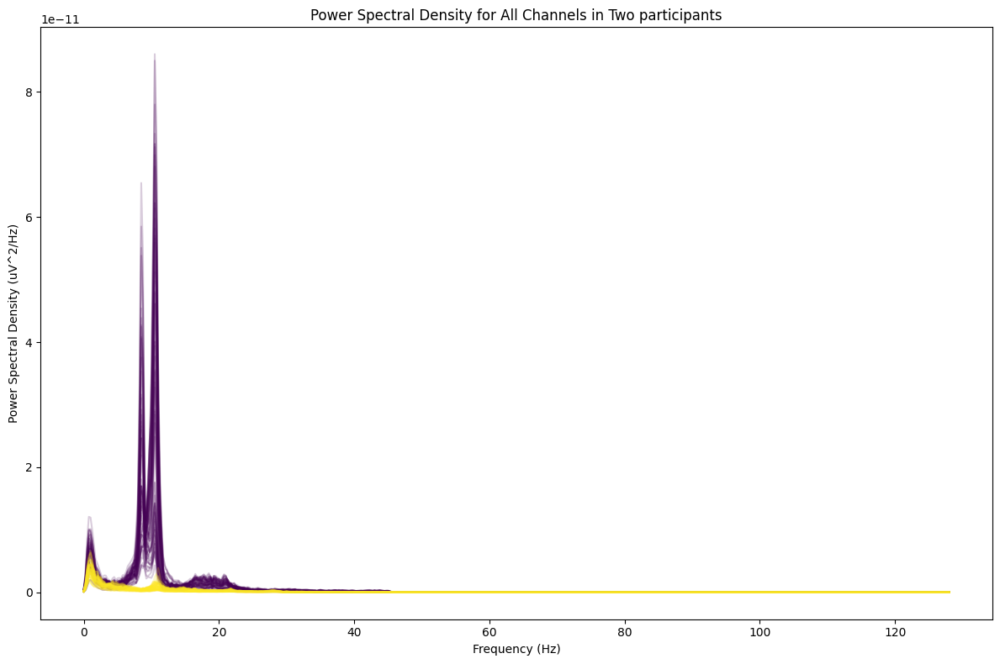

Combined PSD data saved to E:\Analysis\combined_psd_data.xlsx
Plot saved to E:\Analysis\psd_plot.png


In [26]:
import mne
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch
import pandas as pd

# List of file paths (add as many files as you want to process)
file_paths = [
    r"OC_1_R2_ch256_flt1-45_flt50_rejectedarte_rch_imp_ICA_prep_rf.set",
    r"UID_101_R2256_imp_ch_flt1-45_flt50_rejectedarte_rch_ICA_prep_rf.set"  # Replace with your second file path
]

# Initialize a list to store PSD data and channel names for each file
all_psd_data = []
all_freqs = None
all_channel_names = []

# Define a list of colors (you can customize this list)
colors = plt.cm.viridis(np.linspace(0, 1, len(file_paths)))  # Color map from matplotlib

# Step 1: Loop through each file to compute the PSD
for file_idx, file_path in enumerate(file_paths):
    # Load the EEG data
    raw = mne.io.read_raw_eeglab(file_path, preload=True)
    
    # Get EEG data as a numpy array
    eeg_data = raw.get_data()  # Shape: (n_channels, n_samples)
    sfreq = raw.info['sfreq']  # Sampling frequency
    
    # Compute PSD using Welch's method for each channel
    psds = []
    for i in range(eeg_data.shape[0]):
        f, Pxx = welch(eeg_data[i, :], fs=sfreq, nperseg=1024)
        
        if all_freqs is None:
            all_freqs = f  # Frequencies are the same for all channels, save once
        
        psds.append(Pxx)
    
    # Convert the PSDs to a numpy array (channels x frequencies)
    psds = np.array(psds)
    
    # Store the results for this file
    all_psd_data.append(psds)
    all_channel_names.extend(raw.info['ch_names'])

# Step 2: Plot Power Spectral Density for all files and channels with different colors
plt.figure(figsize=(12, 8))

for file_idx, psds in enumerate(all_psd_data):
    # Get the color for this file
    color = colors[file_idx]
    
    for j in range(psds.shape[0]):
        # Plot PSD of each channel for this file with the specific color
        plt.plot(all_freqs, psds[j], label=f'File {file_idx+1}, Channel: {all_channel_names[j]}', 
                 color=color, alpha=0.2)  # Transparency added

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density (uV^2/Hz)')
plt.title('Power Spectral Density for All Channels in Two participants')
# plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()

# Save the plot as a PNG file
plot_filename = r'psd_plot.png'
plt.savefig(plot_filename, format='png')

# Show the plot
plt.show()

# Step 3: Save the combined PSD data to an Excel file for FOOOF analysis
# Combine all PSD data for all files into a single DataFrame
psd_df = pd.DataFrame(np.vstack(all_psd_data).T, columns=all_channel_names, index=all_freqs)

# Save to Excel
excel_file = r'combined_psd_data.xlsx'
psd_df.to_excel(excel_file)

print(f"Combined PSD data saved to {excel_file}")
print(f"Plot saved to {plot_filename}")



Reading E:\Analysis\re-referenced\OC\OC_1_R2_ch256_flt1-45_flt50_rejectedarte_rch_imp_ICA_prep_rf.fdt
Reading 0 ... 45380  =      0.000 ...   177.266 secs...


C:\Users\donat\AppData\Local\Temp\ipykernel_5944\1002184340.py:28: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(file_path, preload=True)


Reading E:\Analysis\re-referenced\UID\UID_101_R2256_imp_ch_flt1-45_flt50_rejectedarte_rch_ICA_prep_rf.fdt
Reading 0 ... 42281  =      0.000 ...   165.160 secs...


C:\Users\donat\AppData\Local\Temp\ipykernel_5944\1002184340.py:28: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(file_path, preload=True)


Combined PSD data saved to E:\Analysis\combined_psd_data.xlsx


C:\Users\donat\miniconda3\envs\test3\Lib\site-packages\fooof\plts\utils.py:40: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  _, ax = plt.subplots(figsize=figsize)


<Figure size 1200x800 with 0 Axes>

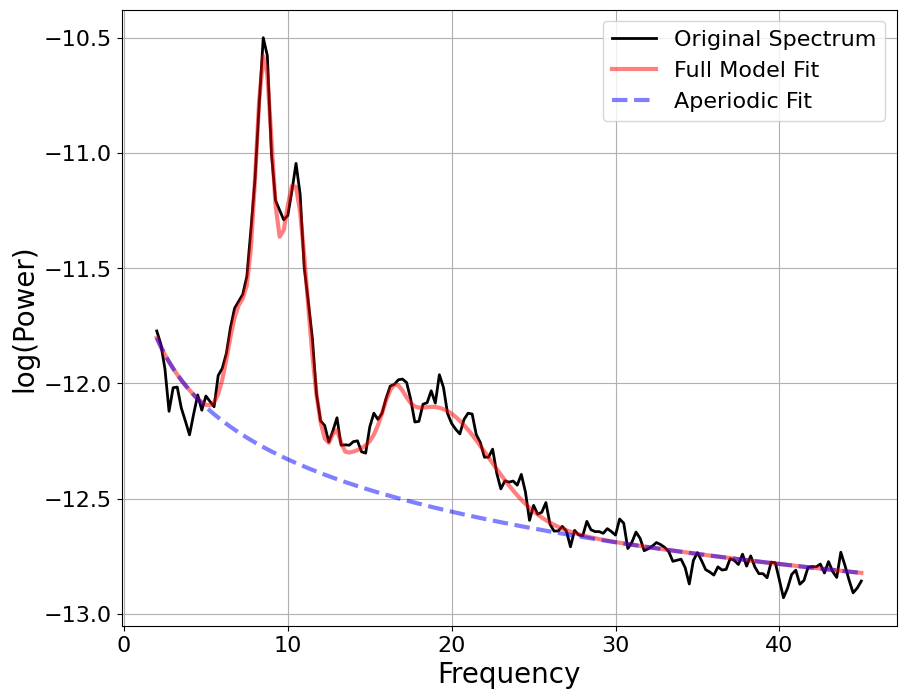

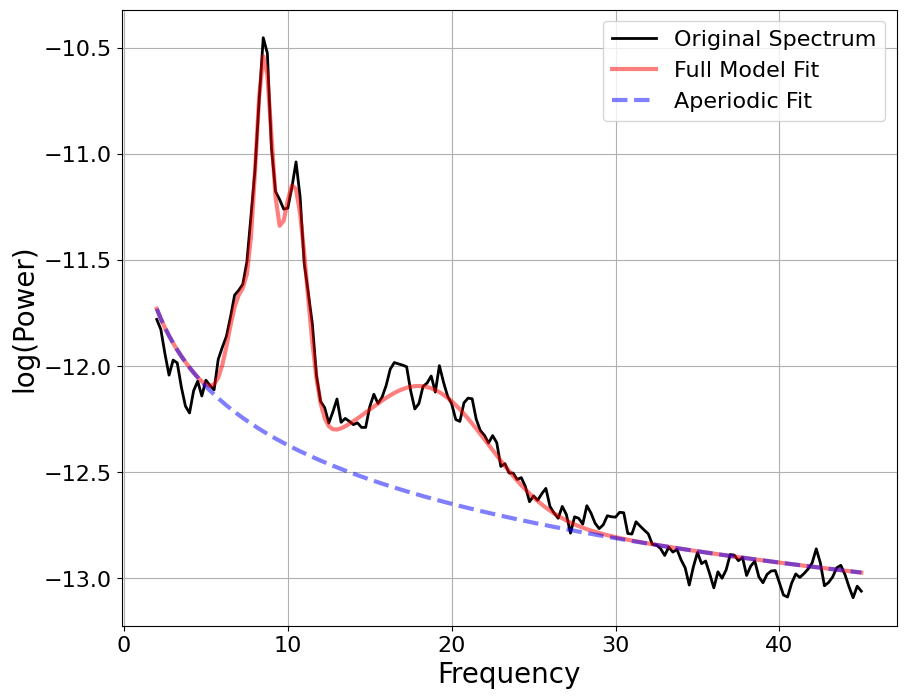

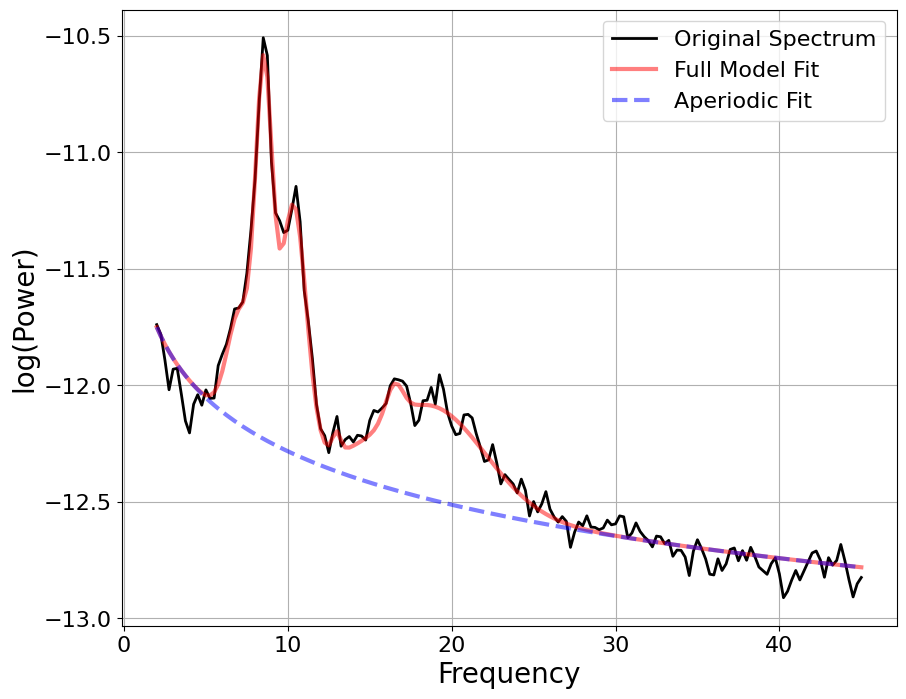

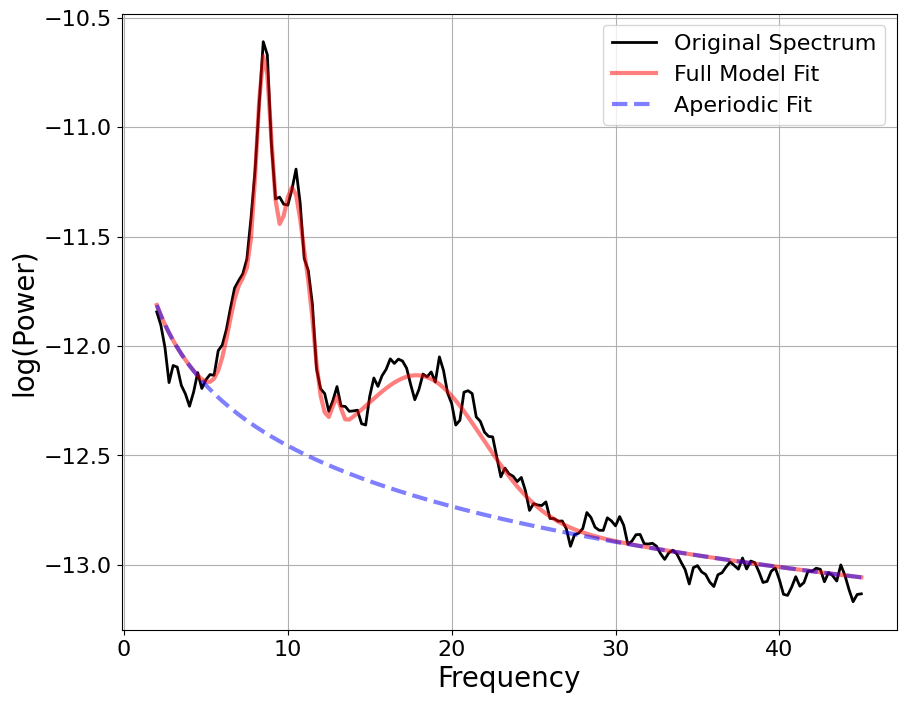

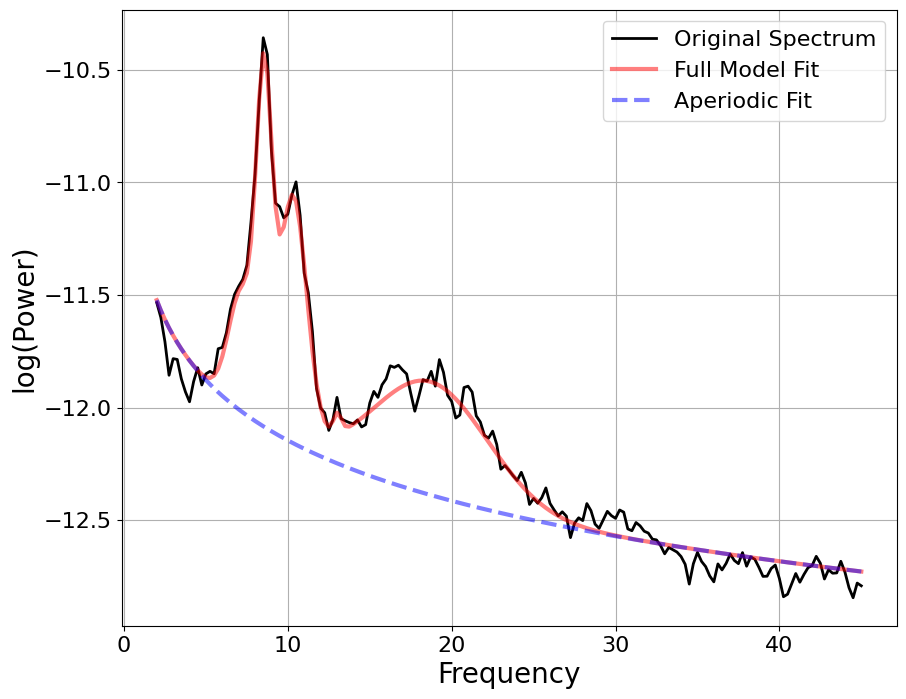

...

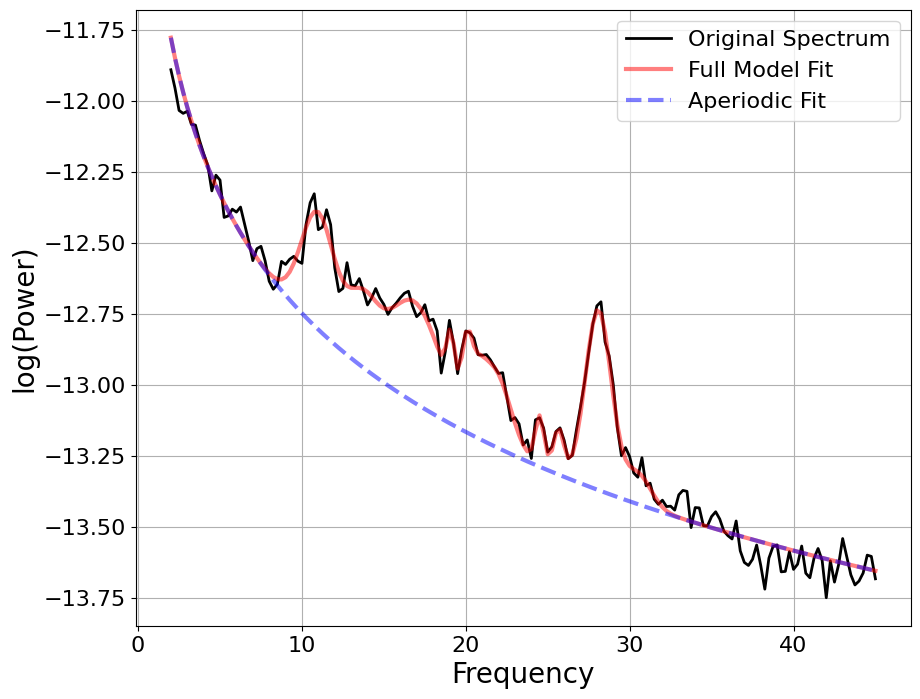

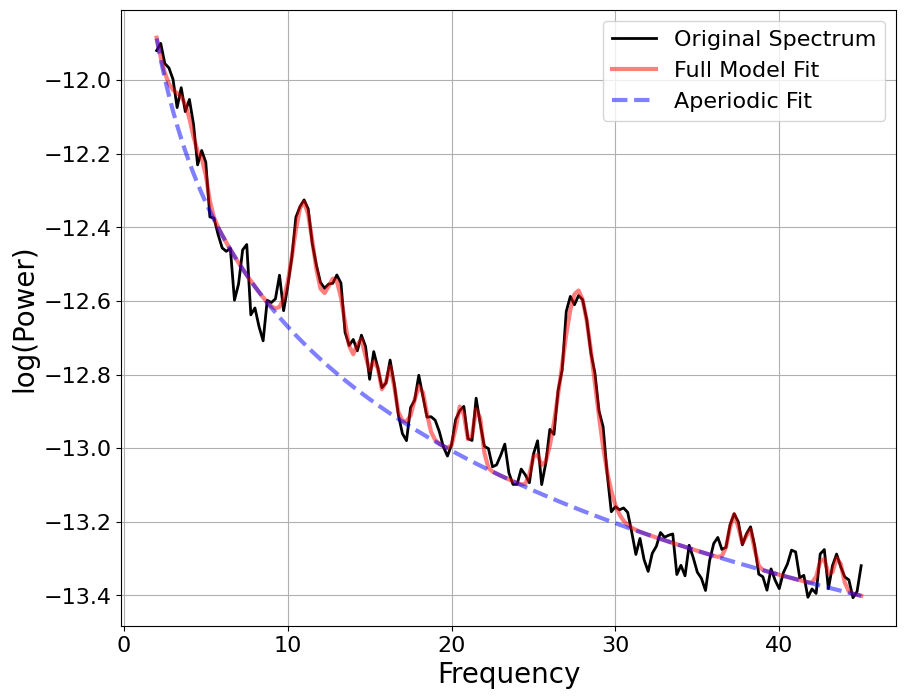

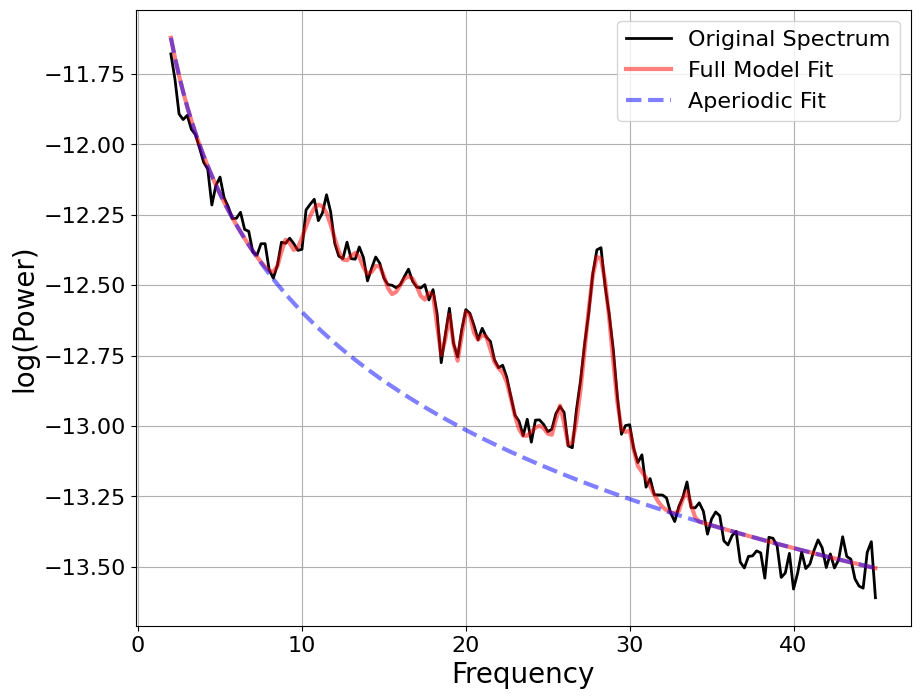

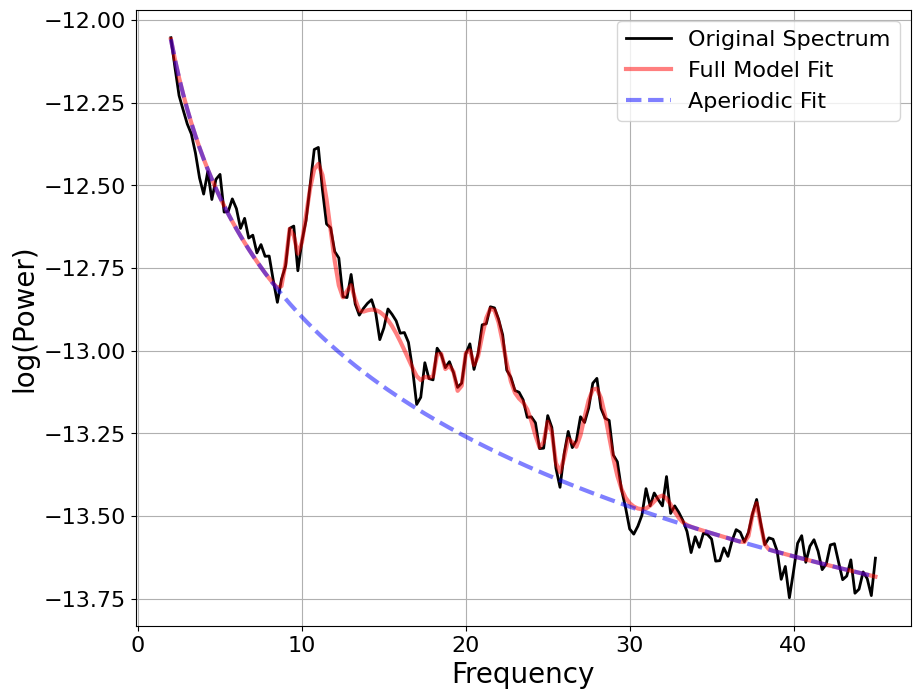

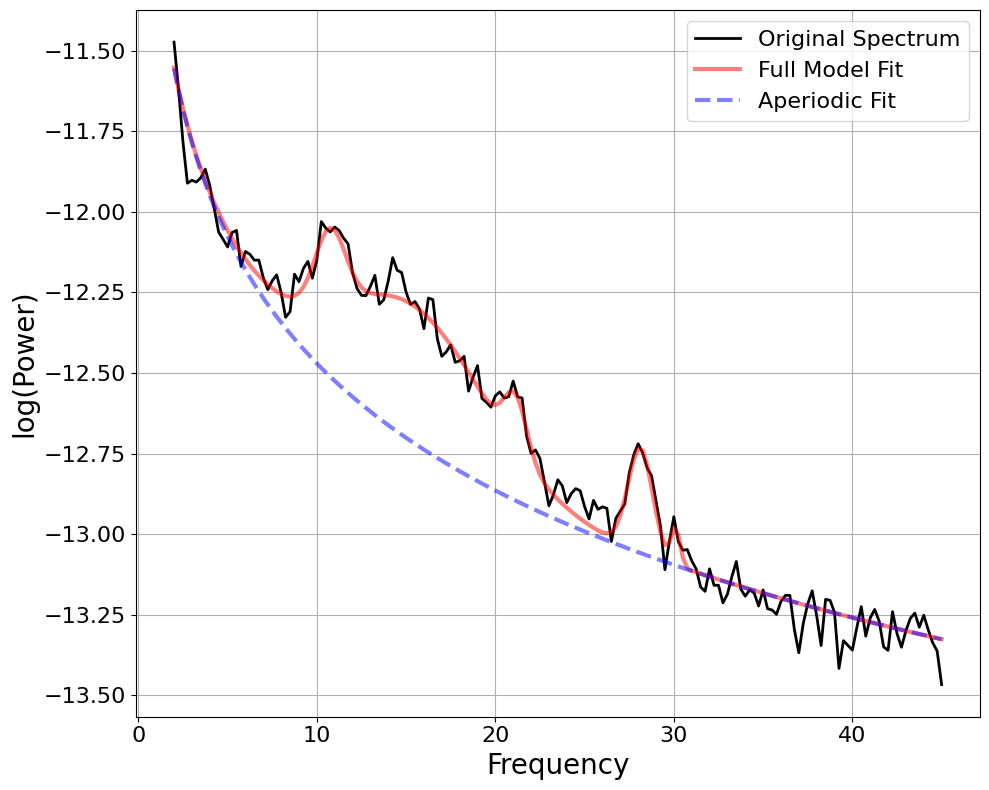

AttributeError: 'FOOOF' object has no attribute 'oscillatory_params_'

In [25]:
import mne
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch
import pandas as pd
from fooof import FOOOF  # Import the Fooof package

# List of file paths (add as many files as you want to process)
file_paths = [
    r"OC_1_R2_ch256_flt1-45_flt50_rejectedarte_rch_imp_ICA_prep_rf.set",
    r"ID_101_R2256_imp_ch_flt1-45_flt50_rejectedarte_rch_ICA_prep_rf.set"  # Replace with your second file path
]

# Initialize a list to store PSD data and channel names for each file
all_psd_data = []
all_freqs = None
all_channel_names = []

# Initialize a list to store FOOOF model results
fooof_results = []

# Define a list of colors (you can customize this list)
colors = plt.cm.viridis(np.linspace(0, 1, len(file_paths)))  # Color map from matplotlib

# Step 1: Loop through each file to compute the PSD and fit FOOOF model
for file_idx, file_path in enumerate(file_paths):
    # Load the EEG data
    raw = mne.io.read_raw_eeglab(file_path, preload=True)
    
    # Get EEG data as a numpy array
    eeg_data = raw.get_data()  # Shape: (n_channels, n_samples)
    sfreq = raw.info['sfreq']  # Sampling frequency
    
    # Compute PSD using Welch's method for each channel
    psds = []
    for i in range(eeg_data.shape[0]):
        f, Pxx = welch(eeg_data[i, :], fs=sfreq, nperseg=1024)
        
        if all_freqs is None:
            all_freqs = f  # Frequencies are the same for all channels, save once
        
        psds.append(Pxx)
    
    # Convert the PSDs to a numpy array (channels x frequencies)
    psds = np.array(psds)
    
    # Store the results for this file
    all_psd_data.append(psds)
    all_channel_names.extend(raw.info['ch_names'])
    
    # Step 2: Fit the FOOOF model to the PSD of each channel
    for psd in psds:
        # Initialize the FOOOF model with desired parameters
        fm = FOOOF()
        
        # Fit the model to the PSD (frequency and power)
        fm.fit(all_freqs, psd, freq_range=[2, 45])  # Fit in the range from 2Hz to 45Hz (for EEG typically)
        
        # Store the results
        fooof_results.append(fm)

# Step 3: Save the combined PSD data to an Excel file for FOOOF analysis
# Combine all PSD data for all files into a single DataFrame
psd_df = pd.DataFrame(np.vstack(all_psd_data).T, columns=all_channel_names, index=all_freqs)

# Save the PSD data to Excel
excel_file = r'combined_psd_data.xlsx'
psd_df.to_excel(excel_file)

print(f"Combined PSD data saved to {excel_file}")

# Step 4: Plot the FOOOF results (Optional)
# Plot FOOOF results (the aperiodic and oscillatory components)
plt.figure(figsize=(12, 8))

for i, fm in enumerate(fooof_results):
    # Plot the aperiodic and oscillatory components for each channel/file
    fm.plot()

plt.tight_layout()
plt.show()

# Step 5: Save the FOOOF results (Optional)
# Save the aperiodic and oscillatory components for all channels to Excel
fooof_aperiodic = [fm.aperiodic_params_ for fm in fooof_results]  # Aperiodic parameters
fooof_oscillatory = [fm.oscillatory_params_ for fm in fooof_results]  # Oscillatory parameters

# Convert to DataFrames for easy analysis
fooof_aperiodic_df = pd.DataFrame(fooof_aperiodic, columns=['Offset', 'Exponent'], index=all_channel_names)
fooof_oscillatory_df = pd.DataFrame(fooof_oscillatory, columns=['Peak Frequency', 'Peak Amplitude'], index=all_channel_names)

# Save to Excel
fooof_file = r'E:\Analysis\fooof_results.xlsx'
with pd.ExcelWriter(fooof_file) as writer:
    fooof_aperiodic_df.to_excel(writer, sheet_name='Aperiodic Params')
    fooof_oscillatory_df.to_excel(writer, sheet_name='Oscillatory Params')

print(f"FOOOF results saved to {fooof_file}")
